# Análisis de Agarres EMG
## Dataset: grupo intacto — NinaPro DB1, DB2, DB4, DB5, DB7

Este notebook analiza 7 tipos de agarre (stimuli 22, 25, 27, 30, 31, 37, 40) usando 8 variables seleccionadas en 8 canales de EMG. El objetivo es:

1. Comparar qué agarres se diferencian entre sí
2. Identificar qué features y canales discriminan mejor
3. Observar si los agarres forman clusters naturales

### Variables seleccionadas
- **Amplitud:** VAR_STD, Range, Energy, Peak_to_Peak, VAR, Max
- **Frecuencia:** MNF, SSC

### Estructura
- **Parte 1:** Preparación de datos
- **Parte 2:** Resumen general por agarre
- **Parte 3:** Comparación visual por canal (violin plots)
- **Parte 4:** Heatmaps resumen por canal y agarre
- **Parte 5:** Tests estadísticos (Kruskal-Wallis)
- **Parte 6:** Post-hoc de Dunn
- **Parte 7:** Clusters (PCA + t-SNE) por tipo de agarre
- **Parte 8:** Clusters por género
- **Parte 9:** Clusters por categoría de IMC
- **Parte 10:** Efecto de la base de datos de origen (Database)


## Parte 0 — Librerías
Importamos las librerías de manipulación de datos, visualización, estadística y machine learning que se usan en todo el notebook.

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import kruskal
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from matplotlib.lines import Line2D  # (faltaba: lo necesita la Parte 9)

sns.set_style('whitegrid')

## Parte 1 — Preparación de datos

Cargamos las señales EMG (features por ventana) y los datos demográficos de los sujetos.

In [36]:
signals = pd.read_csv('../data/master/intact_signals.csv')
subjects = pd.read_csv('../data/master/intact_subjects.csv')

print(f'Signals: {signals.shape}')
print(f'Subjects: {subjects.shape}')

Signals: (273733, 214)
Subjects: (107, 8)


Filtramos: metadatos, las 8 variables seleccionadas en los 8 canales, y los estímulos (agarres) de interés (incluye el 0 = reposo).

In [37]:
meta_cols = ['subject', 'stimulus', 'Database']
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']
signal_cols = [f'Channel {ch}_{feat}' for ch in range(1, 9) for feat in features]
selected_stimuli = [0, 22, 25, 27, 30, 31, 37, 40]

df_raw = signals[signals['stimulus'].isin(selected_stimuli)][meta_cols + signal_cols].copy()
print(f'Ventanas seleccionadas: {len(df_raw)}')
print(f'Columnas: {len(df_raw.columns)} (4 meta + {len(signal_cols)} señal)')

Ventanas seleccionadas: 83291
Columnas: 67 (4 meta + 64 señal)


Calculamos el Índice de Masa Corporal (IMC) de cada sujeto y lo categorizamos en 4 grupos estándar (bajo peso, normal, sobrepeso, obesidad).

In [38]:
subjects['BMI'] = subjects['Weight'] / (subjects['Height'] / 100) ** 2
bins_imc = [0, 18.5, 25, 30, 100]
etiquetas_imc = ['Bajo peso', 'Normal', 'Sobrepeso', 'Obesidad']
subjects['BMI Category'] = pd.cut(subjects['BMI'], bins=bins_imc, labels=etiquetas_imc)

Normalizamos (Z-score) cada variable **por combinación Database + estímulo**, para que las diferencias de escala entre bases de datos NinaPro no dominen el análisis. Luego promediamos las ventanas por sujeto.

In [39]:
from sklearn.preprocessing import StandardScaler

results = []

for db in df_raw['Database'].unique():
    for stim in selected_stimuli:
        mask = (df_raw['Database'] == db) & (df_raw['stimulus'] == stim)
        df_sub = df_raw[mask].copy()
        
        if len(df_sub) == 0:
            continue
        
        # Z-score por DB+estímulo
        scaler = StandardScaler()
        df_sub[signal_cols] = scaler.fit_transform(df_sub[signal_cols])
        
        # Promediar ventanas por sujeto
        df_avg = df_sub.groupby(['subject', 'Database', 'stimulus'])[signal_cols].mean().reset_index()
        results.append(df_avg)

df_final = pd.concat(results, ignore_index=True)

Unimos los datos normalizados con la información demográfica de cada sujeto (edad, género, IMC, etc.).

In [40]:
# Merge por subject + Database
# Nota: df_final tiene 'subject' (minúscula), subjects tiene 'Subject' (mayúscula)
df_final = df_final.merge(
    subjects, 
    left_on=['subject', 'Database'], 
    right_on=['Subject', 'Database'],
    how='left'
).drop(columns=['Subject'])  # Eliminar columna duplicada

Dimensiones finales del dataset y cantidad de sujetos/estímulos únicos.

In [41]:
df_final['subject_db'] = df_final['subject'].astype(str) + '_' + df_final['Database']

print(f'DataFrame raw: {df_final.shape}')
print(f'Sujetos (sujeto×BD): {df_final["subject_db"].nunique()}, Stimuli: {df_final["stimulus"].nunique()}')

DataFrame raw: (749, 76)
Sujetos (sujeto×BD): 107, Stimuli: 7


**Agregado:** chequeo rápido de calidad de datos (nulos y duplicados) — no existía en la versión original y es un paso típico de EDA.

In [8]:
print('Valores nulos por columna (solo columnas con nulos):')
nulls = df_final.isna().sum()
print(nulls[nulls > 0] if nulls.sum() > 0 else 'Sin valores nulos.')
print()
print(f'Filas duplicadas: {df_final.duplicated().sum()}')


Valores nulos por columna (solo columnas con nulos):
Hand            7
Handedness      7
Gender          7
Age             7
Height          7
Weight          7
BMI             7
BMI Category    7
dtype: int64

Filas duplicadas: 0


Vista previa del dataset final que se usa en todo el análisis.

In [42]:
df_final

,subject,Database,stimulus,Channel 1_VAR_STD,Channel 1_Range,Channel 1_Energy,Channel 1_Peak_to_Peak,Channel 1_VAR,Channel 1_Max,Channel 1_MNF,...,Channel 8_SSC,Hand,Handedness,Gender,Age,Height,Weight,BMI,BMI Category,subject_db
0,1,DB1,22,-0.639412,0.019865,-0.515060,-0.491838,0.004475,-0.296329,-0.463713,...,-0.106646,Intact,Right,Male,31.0,170.0,75.0,25.951557,Sobrepeso,1_DB1
1,2,DB1,22,-0.215411,0.707191,-0.028119,0.047949,0.387145,0.283442,-0.766149,...,0.454789,Intact,Right,Male,27.0,170.0,62.0,21.453287,Normal,2_DB1
2,3,DB1,22,-0.815924,0.352478,-0.779719,-1.008235,0.203327,-0.873434,-0.141952,...,-0.073293,Intact,Right,Male,22.0,180.0,85.0,26.234568,Sobrepeso,3_DB1
3,4,DB1,22,1.315590,0.690197,1.857589,1.062082,0.184911,1.591771,-0.502916,...,0.671581,Intact,Right,Male,27.0,183.0,95.0,28.367524,Sobrepeso,4_DB1
4,5,DB1,22,-0.847146,-0.565830,-0.822722,-1.291992,-0.284764,-0.938492,2.113718,...,0.382525,Intact,Right,Male,27.0,178.0,75.0,23.671254,Normal,5_DB1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,16,DB7,40,-0.200815,-0.205407,-0.374194,-0.150261,-0.061441,-0.396750,-0.701355,...,0.113662,Intact,Right,Male,30.0,175.0,68.0,22.204082,Normal,16_DB7
745,17,DB7,40,0.287355,0.317399,0.357512,0.389219,0.004306,0.481783,0.440995,...,0.086011,Intact,Right,Male,24.0,178.0,66.0,20.830703,Normal,17_DB7
746,18,DB7,40,-0.054670,0.074034,-0.037301,-0.004000,-0.032984,-0.018439,-0.424158,...,-0.410370,Intact,Right,Male,27.0,180.0,95.0,29.320988,Sobrepeso,18_DB7
747,19,DB7,40,-0.276777,-0.223235,-0.377029,-0.239936,-0.060107,-0.369815,0.656477,...,0.127055,Intact,Right,Male,29.0,183.0,80.0,23.888441,Normal,19_DB7


## Parte 2 — Resumen general por tipo de agarre
Promedio de cada feature por canal y tipo de agarre (sobre todos los sujetos).

In [10]:
resumen = df_final.groupby('stimulus')[signal_cols].mean().round(3)
resumen

,Channel 1_VAR_STD,Channel 1_Range,Channel 1_Energy,Channel 1_Peak_to_Peak,Channel 1_VAR,Channel 1_Max,Channel 1_MNF,Channel 1_SSC,Channel 2_VAR_STD,Channel 2_Range,...,Channel 7_MNF,Channel 7_SSC,Channel 8_VAR_STD,Channel 8_Range,Channel 8_Energy,Channel 8_Peak_to_Peak,Channel 8_VAR,Channel 8_Max,Channel 8_MNF,Channel 8_SSC
stimulus,,,,,,,,,,,,,,,,,,,,,
22,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.002,0.001,-0.000,...,0.002,0.000,0.002,0.002,0.002,0.002,0.002,0.002,0.000,-0.000
25,-0.001,0.001,-0.001,-0.000,0.001,0.000,-0.001,0.001,0.001,0.000,...,0.001,-0.001,0.001,0.002,0.001,0.001,0.001,0.002,0.000,-0.000
27,-0.001,0.000,-0.001,-0.002,0.001,-0.001,0.003,-0.001,-0.001,-0.002,...,0.001,0.000,0.001,-0.000,0.000,0.001,-0.000,-0.000,0.002,0.001
30,0.002,-0.001,-0.001,0.001,-0.000,-0.001,0.004,-0.003,0.005,0.000,...,0.002,-0.003,0.003,0.003,0.003,0.002,0.003,0.002,0.002,-0.001
31,-0.002,0.001,-0.002,-0.002,0.001,-0.001,0.002,-0.001,0.001,0.001,...,0.001,0.001,-0.001,0.001,-0.001,-0.001,0.001,-0.001,0.001,0.001
37,0.001,0.000,0.001,0.001,0.001,0.001,-0.001,-0.001,0.001,0.002,...,0.000,-0.001,0.003,0.002,0.003,0.003,0.001,0.003,0.000,-0.001
40,-0.000,-0.001,-0.000,-0.000,0.000,-0.000,0.000,0.002,0.000,-0.000,...,0.002,0.001,-0.000,0.001,-0.000,0.001,0.000,0.001,-0.000,-0.000


## Parte 3 — Comparación visual por canal y agarre
Para cada una de las 8 variables, graficamos su distribución (violin plot) en cada canal, separando por tipo de agarre.

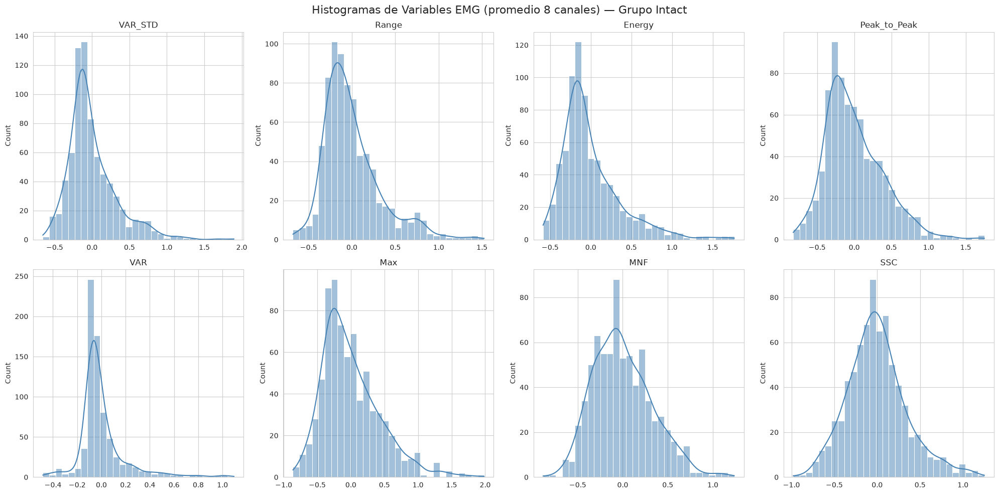

In [44]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Histogramas de Variables EMG (promedio 8 canales) — Grupo Intact', fontsize=16)

for i, feat in enumerate(features):
    ax = axes[i // 4][i % 4]
    # Promedio de los 8 canales para esta feature
    mean_vals = df_final[[f'Channel {ch}_{feat}' for ch in range(1, 9)]].mean(axis=1)
    sns.histplot(mean_vals, kde=True, ax=ax, bins=30, color='steelblue')
    ax.set_title(feat, fontsize=12)
    ax.set_xlabel('')

plt.tight_layout()
plt.show()

**VAR_STD** — variabilidad de la señal, por canal y agarre.

/tmp/ipykernel_4782/558677623.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/558677623.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/558677623.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782

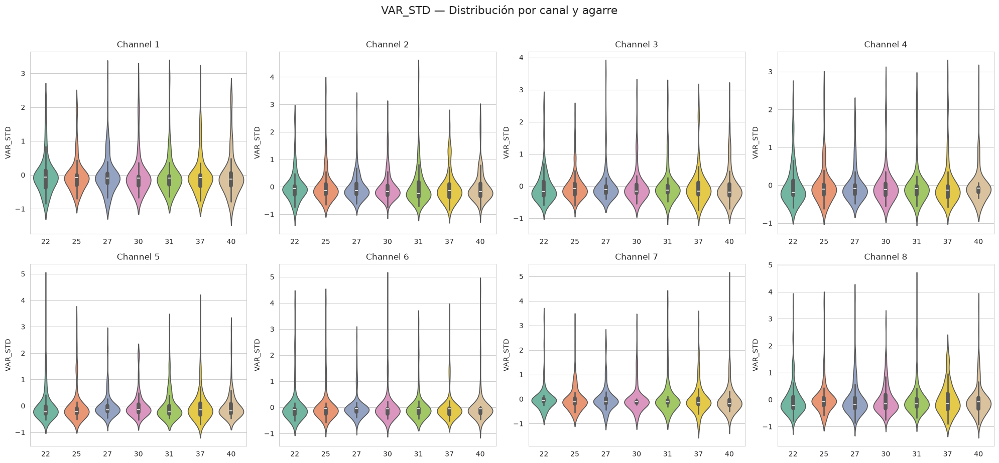

In [11]:
feat = 'VAR_STD'
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)
for idx, ch in enumerate(range(1, 9)):
    ax = axes[ch // 5, (ch - 1) % 4]
    sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Channel {ch}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
plt.tight_layout()
plt.show()

**Range** — rango (máximo − mínimo) de la señal.

/tmp/ipykernel_4782/4075916311.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/4075916311.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/4075916311.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4

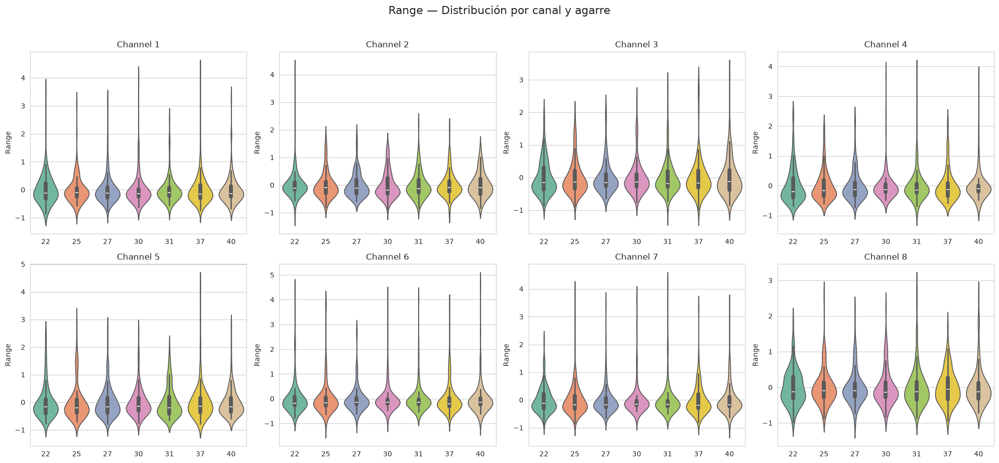

In [12]:
feat = 'Range'
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)
for idx, ch in enumerate(range(1, 9)):
    ax = axes[ch // 5, (ch - 1) % 4]
    sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Channel {ch}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
plt.tight_layout()
plt.show()

**Energy** — energía de la señal.

/tmp/ipykernel_4782/2246926212.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/2246926212.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/2246926212.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4

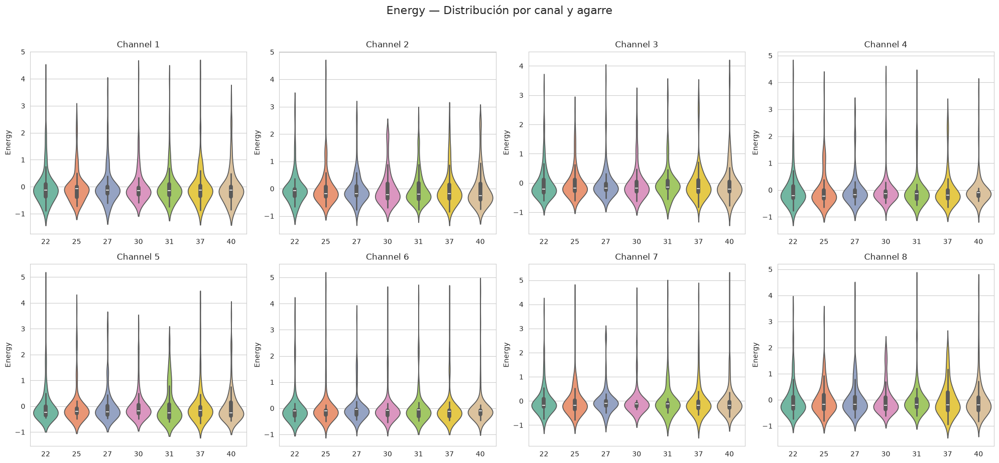

In [13]:
feat = 'Energy'
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)
for idx, ch in enumerate(range(1, 9)):
    ax = axes[ch // 5, (ch - 1) % 4]
    sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Channel {ch}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
plt.tight_layout()
plt.show()

**Peak_to_Peak** — amplitud pico a pico.

/tmp/ipykernel_4782/1519680759.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1519680759.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1519680759.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4

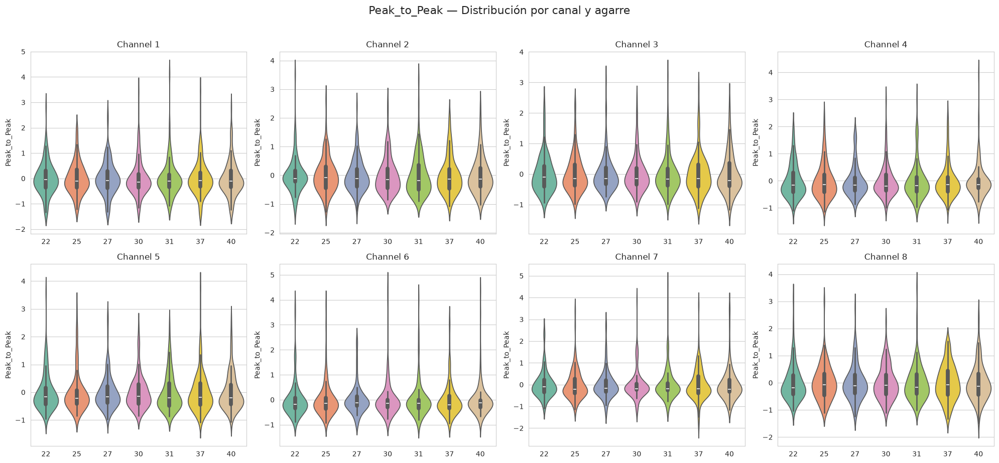

In [14]:
feat = 'Peak_to_Peak'
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)
for idx, ch in enumerate(range(1, 9)):
    ax = axes[ch // 5, (ch - 1) % 4]
    sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Channel {ch}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
plt.tight_layout()
plt.show()

**Max** — valor máximo por canal (eje X = agarre).

/tmp/ipykernel_4782/2429893317.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/2429893317.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/2429893317.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4

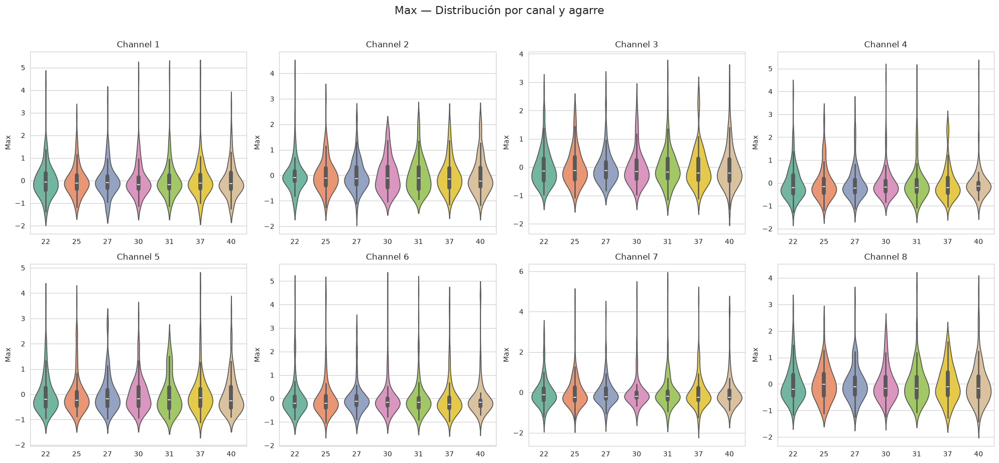

In [15]:
feat = 'Max'
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)
for idx, ch in enumerate(range(1, 9)):
    ax = axes[ch // 5, (ch - 1) % 4]
    sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Channel {ch}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
plt.tight_layout()
plt.show()

**Max** — misma variable, pero organizada por agarre (eje X = canal), para comparar canales dentro de un mismo agarre.

/tmp/ipykernel_4782/1753025843.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1753025843.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1753025843.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1753025843.py:16: FutureWarning: 

Passing `palette` 

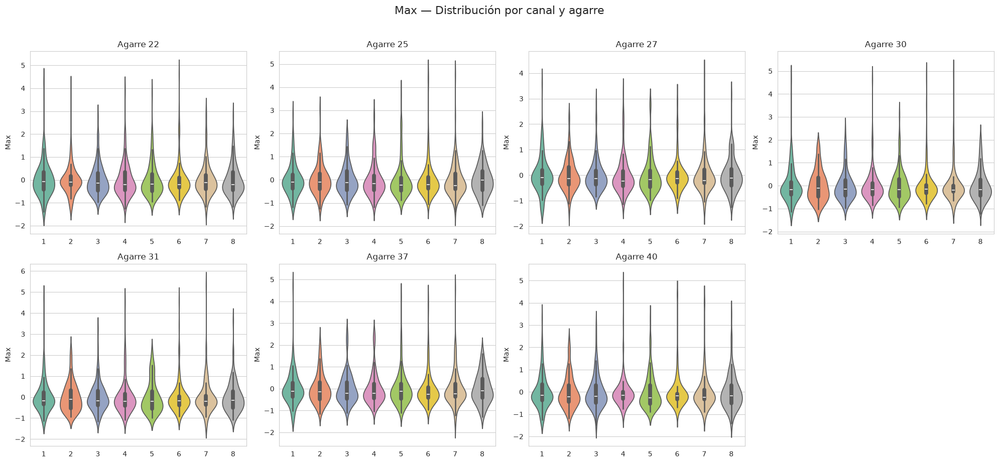

In [16]:
feat = 'Max'
stimuli_no_rest = [22, 25, 27, 30, 31, 37, 40]  # excluye el estimulo 0 (reposo); renombrada para no pisar 'selected_stimuli'

fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)

for idx, stim in enumerate(stimuli_no_rest):
    ax = axes[idx // 4, idx % 4]
    df_stim = df_final[df_final['stimulus'] == stim]
    
    # Preparar datos en formato long para seaborn
    cols = [f'Channel {ch}_{feat}' for ch in range(1, 9)]
    df_long = df_stim[cols].melt(var_name='Channel', value_name=feat)
    df_long['Channel'] = df_long['Channel'].str.extract(r'Channel (\d+)')
    
    sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Agarre {stim}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)

# Ocultar subplot vacío (8° posición)
axes[1, 3].set_visible(False)

plt.tight_layout()
plt.show()

**MNF** — frecuencia media (dominio de frecuencia).

/tmp/ipykernel_4782/3470172578.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/3470172578.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/3470172578.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4

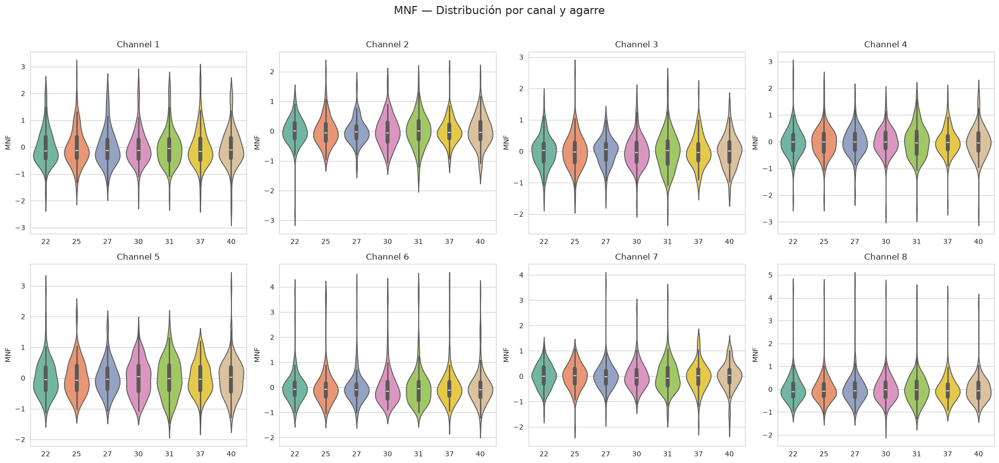

In [17]:
feat = 'MNF'
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)
for idx, ch in enumerate(range(1, 9)):
    ax = axes[ch // 5, (ch - 1) % 4]
    sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Channel {ch}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
plt.tight_layout()
plt.show()

**SSC** — cambios de signo de pendiente (Slope Sign Changes).

/tmp/ipykernel_4782/3287287788.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/3287287788.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/3287287788.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4

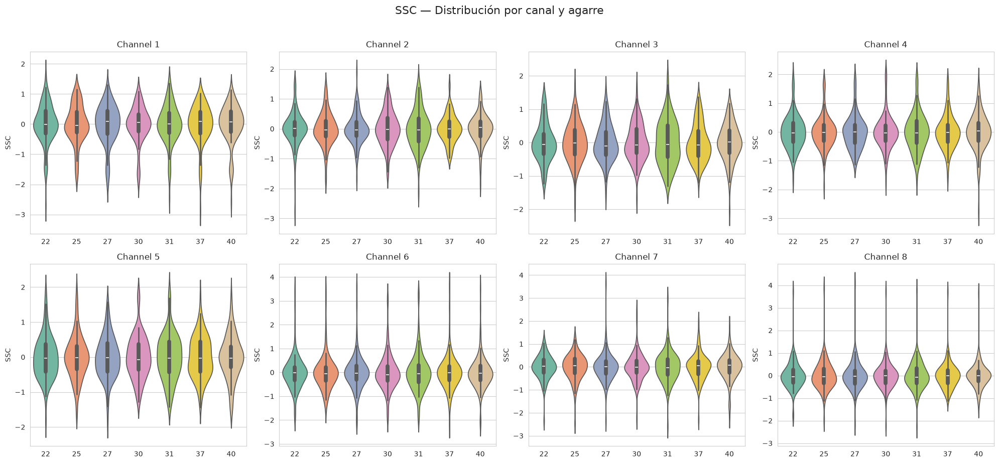

In [18]:
feat = 'SSC'
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle(f'{feat} — Distribución por canal y agarre', fontsize=16, y=1.02)
for idx, ch in enumerate(range(1, 9)):
    ax = axes[ch // 5, (ch - 1) % 4]
    sns.violinplot(data=df_final, x='stimulus', y=f'Channel {ch}_{feat}', ax=ax, palette='Set2', inner='box')
    ax.set_title(f'Channel {ch}')
    ax.set_xlabel('')
    ax.set_ylabel(feat)
plt.tight_layout()
plt.show()

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

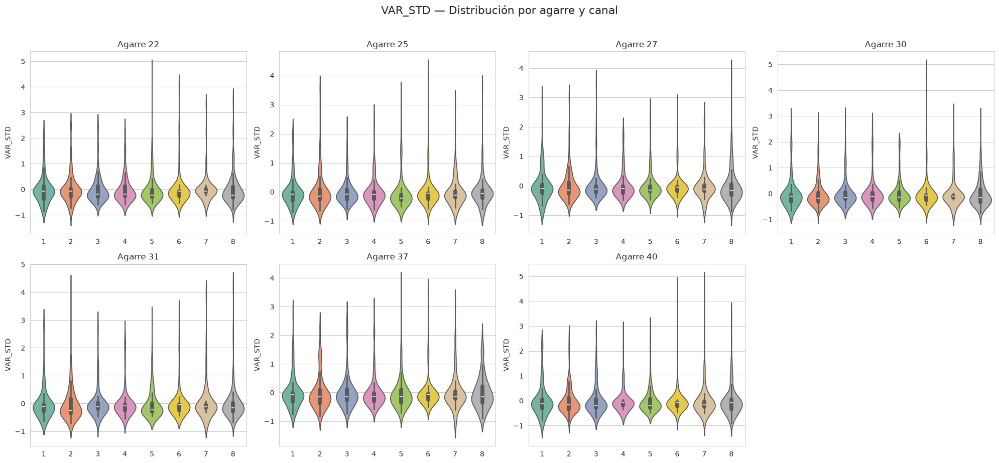

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

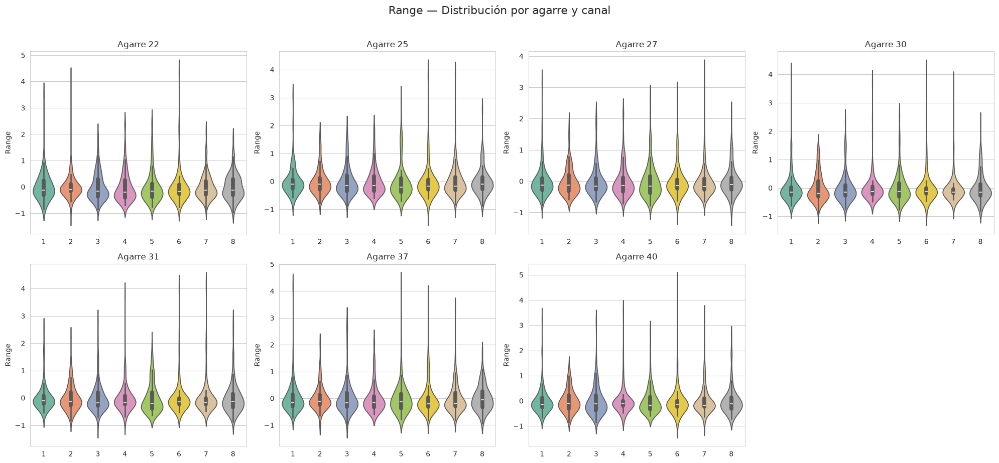

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

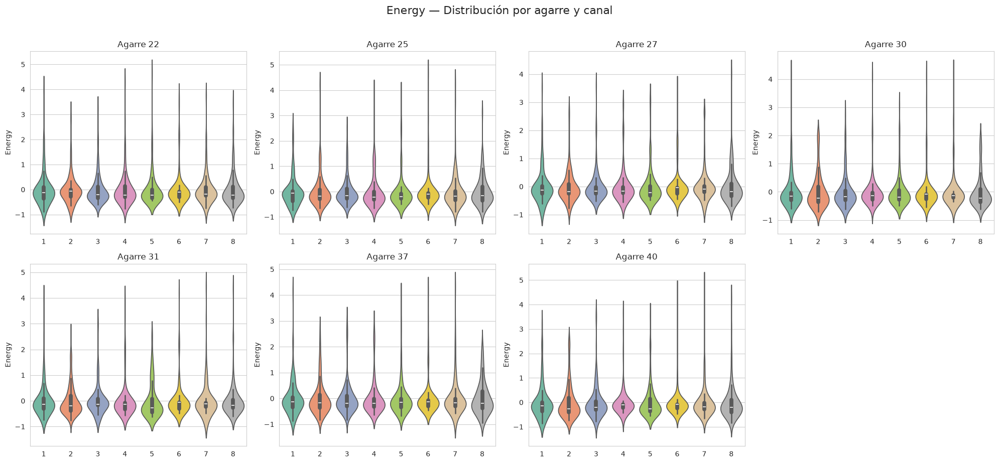

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

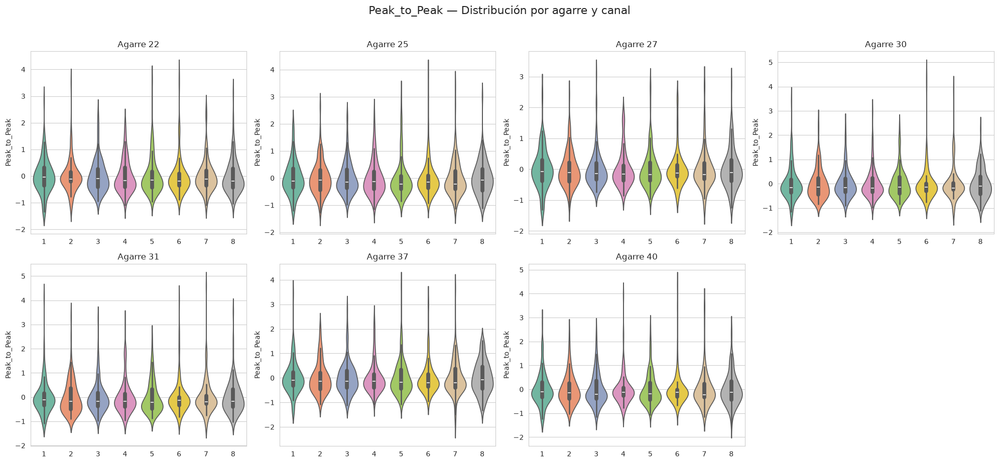

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

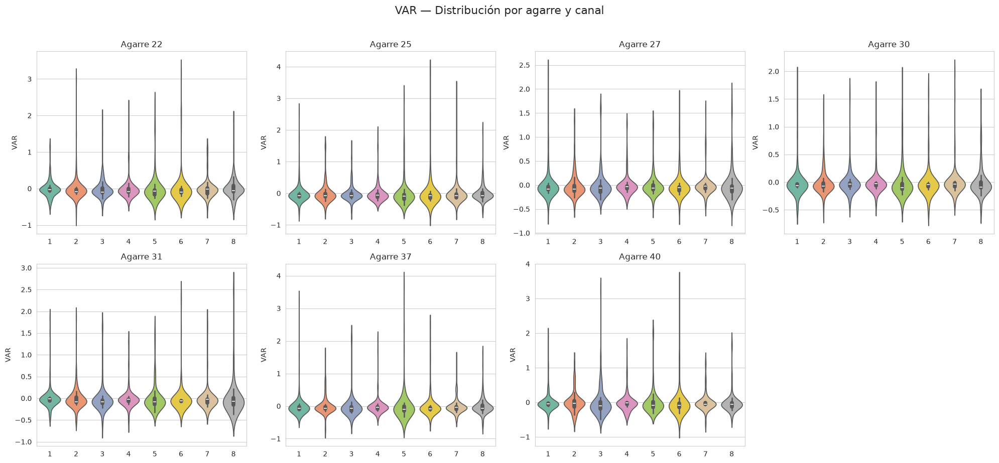

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

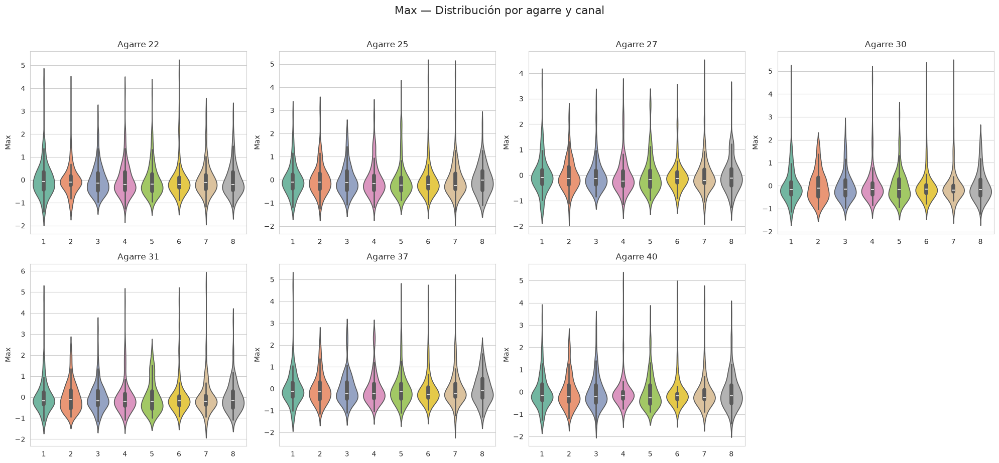

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

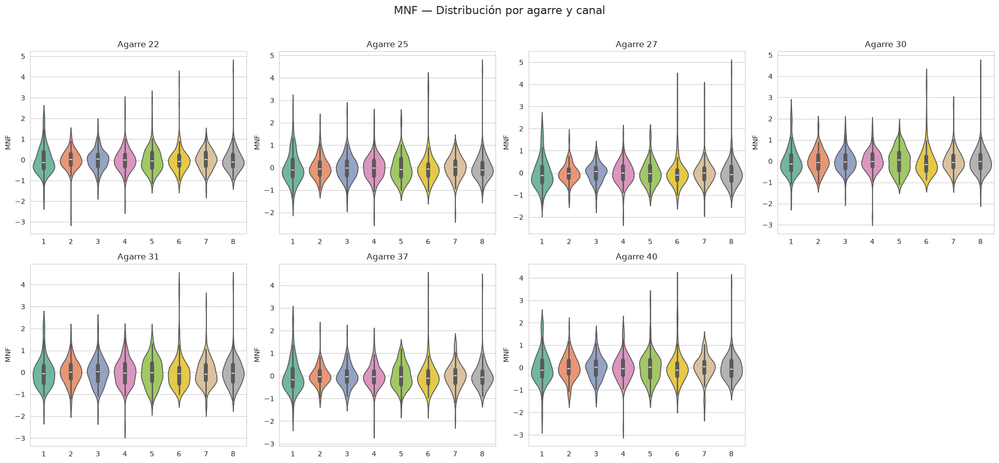

/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
/tmp/ipykernel_4782/1946777603.py:17: FutureWarning: 

Passing `palette` 

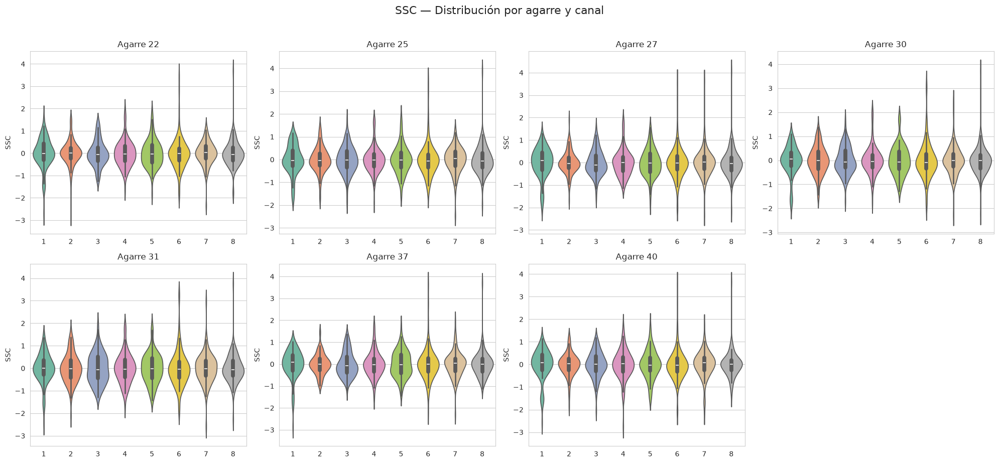

In [19]:
def plot_violin_by_grasp(feat, stimuli, ncols=4):
    """Violin plot de `feat` por canal, un subplot por cada agarre."""
    n = len(stimuli)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.5 * nrows))
    axes = np.atleast_1d(axes).flatten()
    fig.suptitle(f'{feat} — Distribución por agarre y canal', fontsize=16, y=1.02)

    for idx, stim in enumerate(stimuli):
        ax = axes[idx]
        df_stim = df_final[df_final['stimulus'] == stim]

        cols = [f'Channel {ch}_{feat}' for ch in range(1, 9)]
        df_long = df_stim[cols].melt(var_name='Channel', value_name=feat)
        df_long['Channel'] = df_long['Channel'].str.extract(r'Channel (\d+)')

        sns.violinplot(data=df_long, x='Channel', y=feat, ax=ax, palette='Set2', inner='box')
        ax.set_title(f'Agarre {stim}')
        ax.set_xlabel('')
        ax.set_ylabel(feat)

    # Ocultar subplots sobrantes si stimuli no llena la grilla
    for j in range(n, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

selected_stimuli = sorted(df_final['stimulus'].unique())

for feat in features:
    plot_violin_by_grasp(feat, selected_stimuli)

## Parte 4 — Heatmaps: promedio por canal y agarre
Resumen compacto de las 8 variables: promedio de cada canal para cada tipo de agarre.

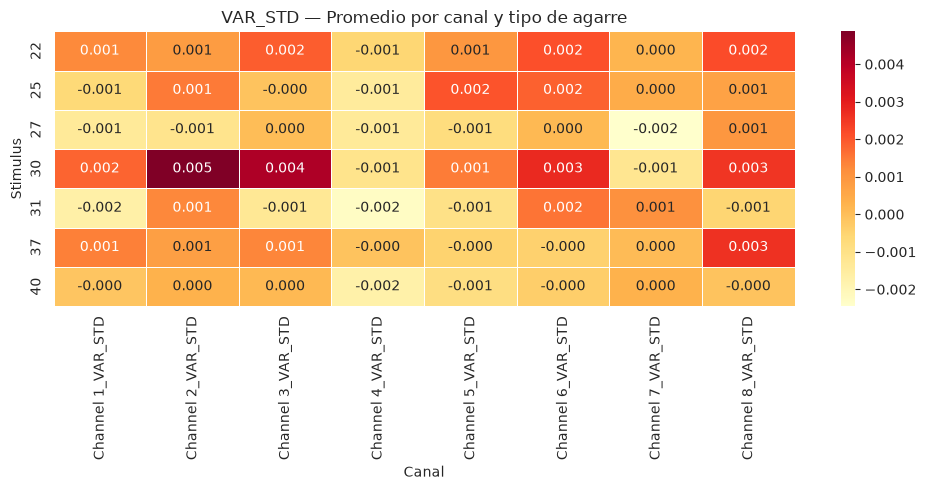

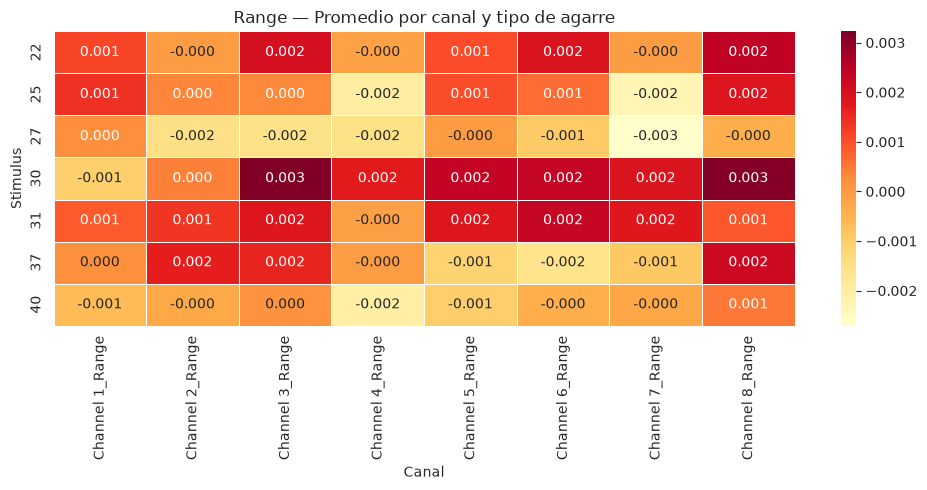

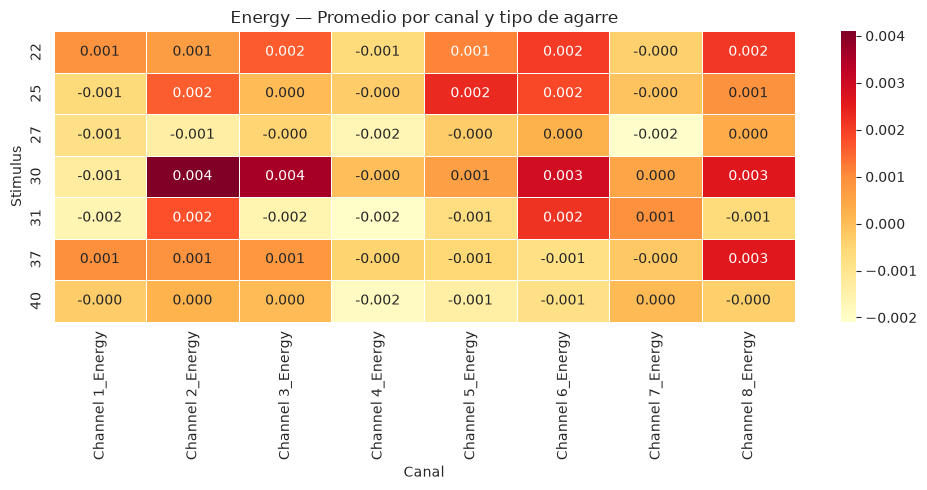

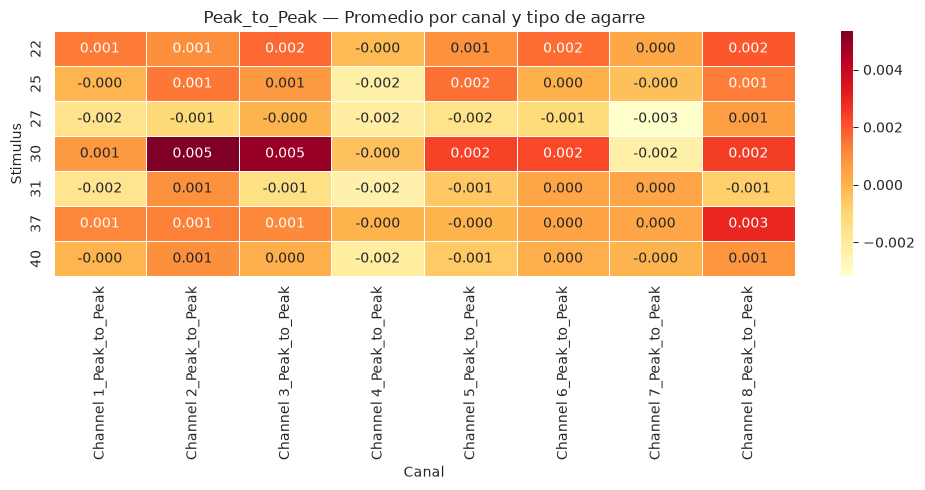

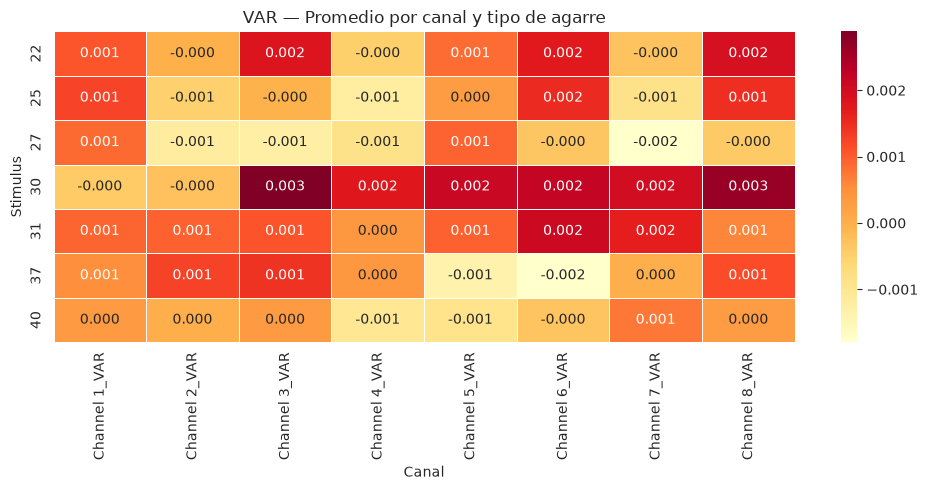

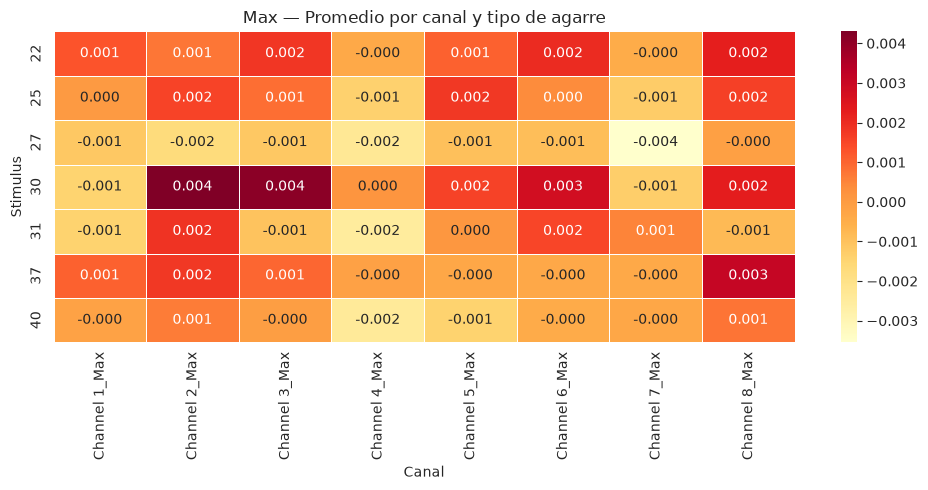

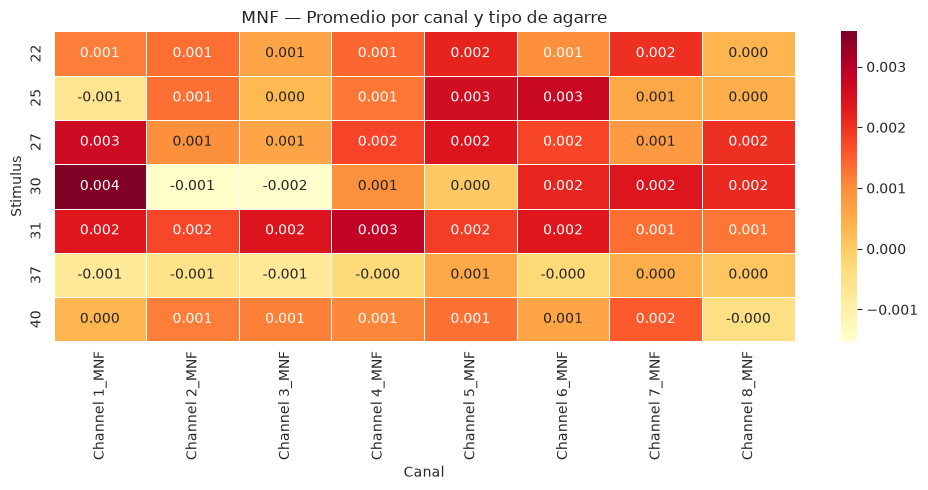

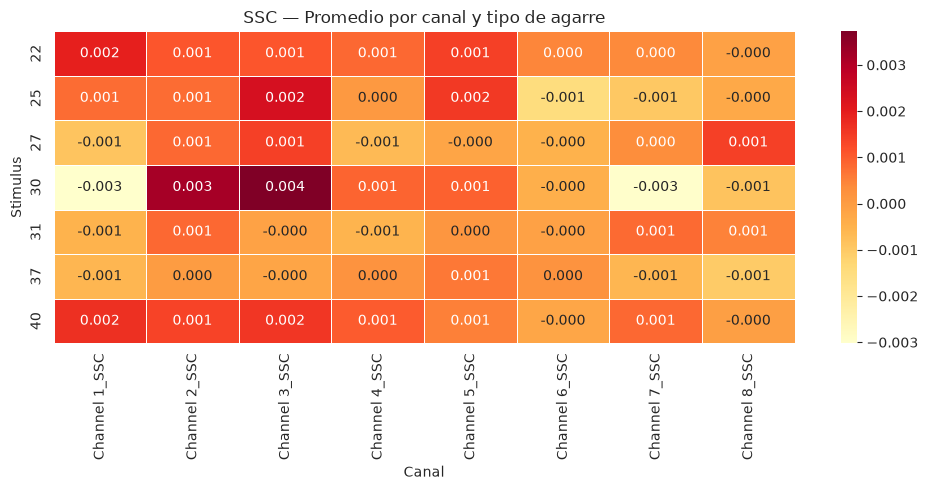

In [20]:
for feat in features:
    ch_cols = [f'Channel {ch}_{feat}' for ch in range(1, 9)]
    pivot = df_final.groupby('stimulus')[ch_cols].mean()
    plt.figure(figsize=(10, 5))
    sns.heatmap(pivot, annot=True, fmt='.3f', cmap='YlOrRd', linewidths=0.5)
    plt.title(f'{feat} — Promedio por canal y tipo de agarre')
    plt.xlabel('Canal')
    plt.ylabel('Stimulus')
    plt.tight_layout()
    plt.show()

## Parte 5 — Tests estadísticos: diferencias entre agarres

**Kruskal-Wallis:** test no paramétrico que verifica si al menos un agarre difiere significativamente en cada feature.

In [21]:
n_por_stim = df_final.groupby('stimulus').apply(
    lambda g: g[['subject', 'Database']].drop_duplicates().shape[0]
)
n_por_stim.name = 'n_sujetos'
print(n_por_stim)

stimulus
22    107
25    107
27    107
30    107
31    107
37    107
40    107
Name: n_sujetos, dtype: int64


In [22]:
from scipy.stats import friedmanchisquare

friedman_results = []
for feat in signal_cols:
    groups = []
    for stim in sorted(df_final['stimulus'].unique()):
        vals = df_final[df_final['stimulus'] == stim][feat].values
        groups.append(vals)
    
    min_len = min(len(g) for g in groups)
    groups = [g[:min_len] for g in groups]
    
    if len(groups) >= 3:
        stat, p_value = friedmanchisquare(*groups)
        friedman_results.append({'Feature': feat, 'H-statistic': round(stat, 3), 'p-value': p_value})

friedman_df = pd.DataFrame(friedman_results).sort_values('p-value')
friedman_df['Significativo'] = friedman_df['p-value'].apply(
    lambda p: '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else 'ns'
)
friedman_df

,Feature,H-statistic,p-value,Significativo
44,Channel 6_VAR,94.562,3.410469e-18,***
48,Channel 7_VAR_STD,90.801,2.065457e-17,***
4,Channel 1_VAR,90.172,2.790383e-17,***
40,Channel 6_VAR_STD,81.985,1.388923e-15,***
0,Channel 1_VAR_STD,64.598,5.210984e-12,***
...,...,...,...,...
62,Channel 8_MNF,1.418,9.647611e-01,ns
57,Channel 8_Range,1.334,9.697625e-01,ns
31,Channel 4_SSC,1.330,9.699906e-01,ns
39,Channel 5_SSC,0.993,9.858641e-01,ns


## Parte 6 — Post-hoc de Dunn: pares de agarres que difieren

Para cada feature significativa en el test de Friedman (p < 0.05), se aplica el test post-hoc de Dunn con corrección de Bonferroni para identificar qué pares de agarres difieren significativamente. Solo se muestran comparaciones con p < 0.05.

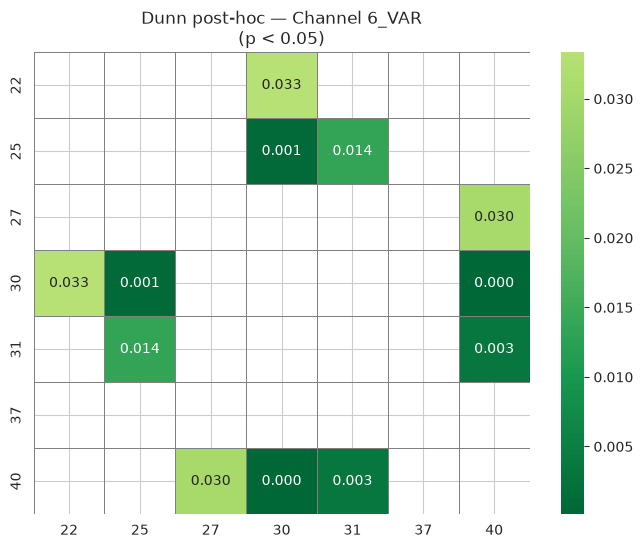

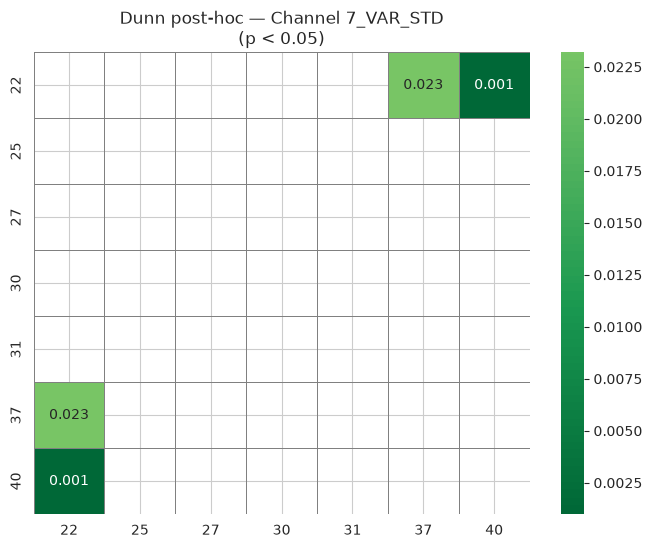

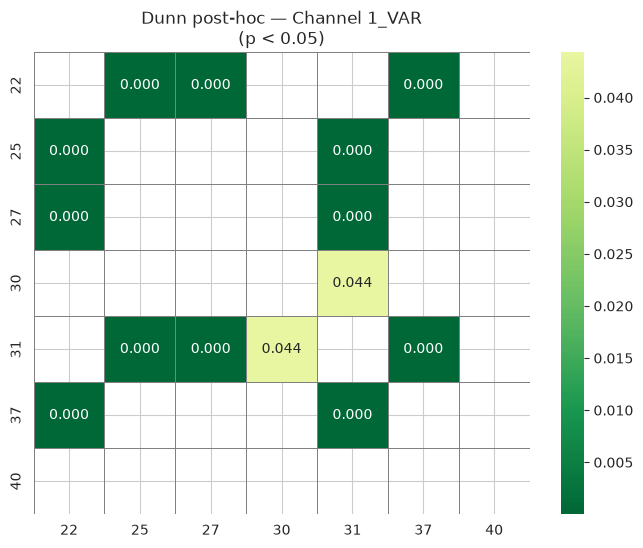

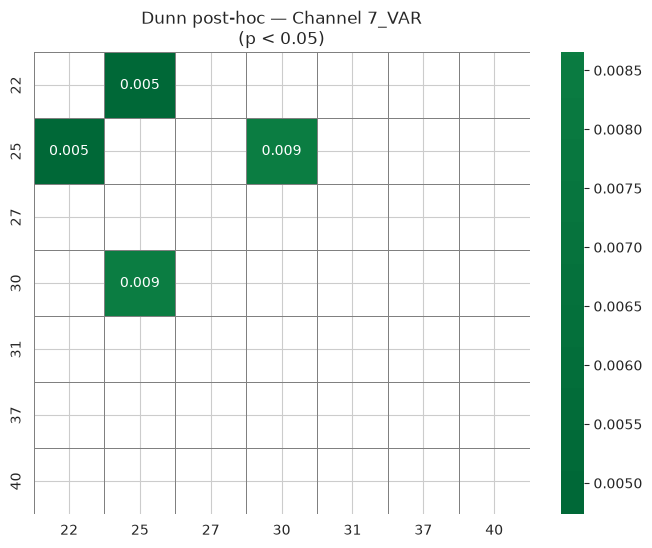

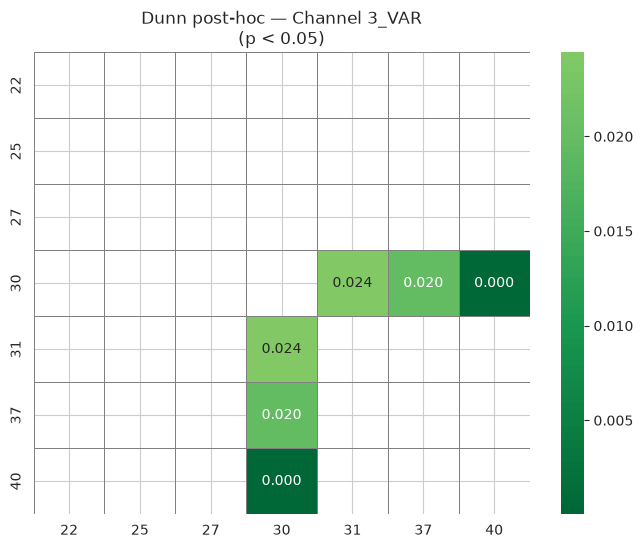

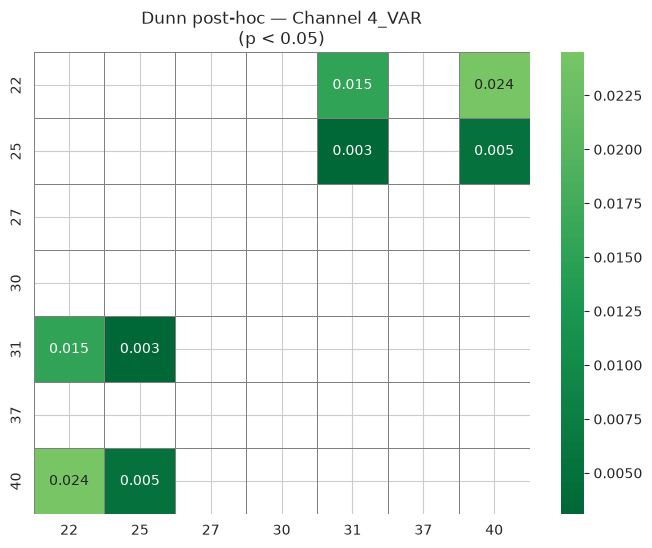

In [23]:
from scikit_posthocs import posthoc_dunn

significant = friedman_df[friedman_df['p-value'] < 0.05]['Feature'].tolist()

for feat in significant[:]:  # Top 10
    dunn = posthoc_dunn(df_final, val_col=feat, group_col='stimulus', p_adjust='bonferroni')
    
    if (dunn < 0.05).any().any():
        mask = dunn >= 0.05
        plt.figure(figsize=(8, 6))
        sns.heatmap(dunn, annot=True, fmt='.3f', cmap='RdYlGn_r', center=0.05,
                    mask=mask, linewidths=0.5, linecolor='gray')
        plt.title(f'Dunn post-hoc — {feat}\n(p < 0.05)')
        plt.show()

In [24]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder

X = df_final[signal_cols].values
le = LabelEncoder()
y = le.fit_transform(df_final['stimulus'].values)

# 1. Accuracy con cross-validation
rf = RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1)
scores = cross_val_score(rf, X, y, cv=5, scoring='accuracy')
print(f'Accuracy CV: {scores.mean():.3f} ± {scores.std():.3f}')

# 2. Importancias
rf.fit(X, y)
importances = pd.DataFrame({
    'Feature': signal_cols,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)


Accuracy CV: 0.477 ± 0.332


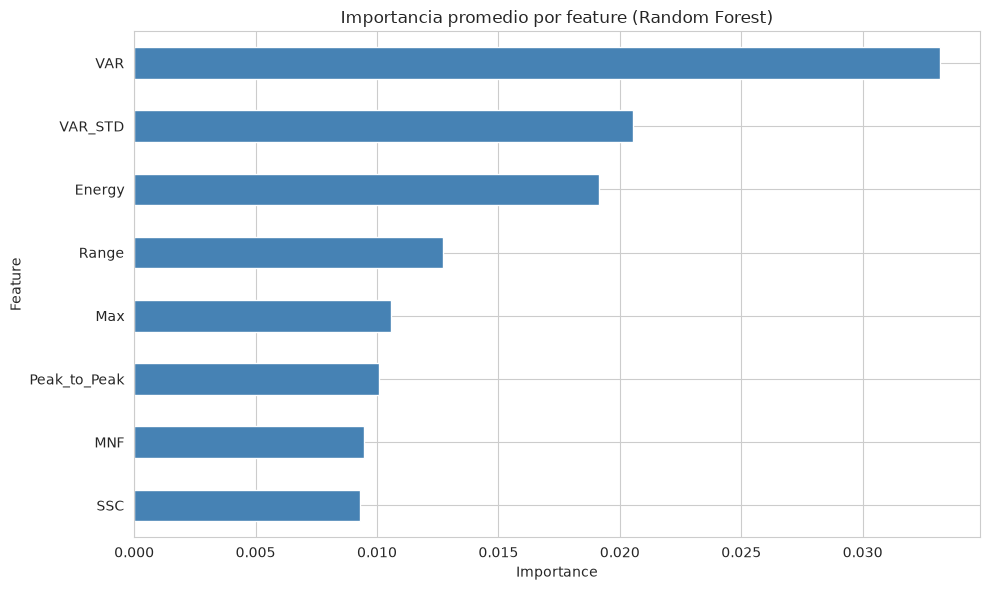

In [25]:
importances_summary = importances.copy()
importances_summary['Feature_Name'] = importances_summary['Feature'].str.extract(r'_(\w+)$')
feat_importance = importances_summary.groupby('Feature_Name')['Importance'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
feat_importance.plot(kind='barh', color='steelblue')
plt.title('Importancia promedio por feature (Random Forest)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

/tmp/ipykernel_4782/3248818229.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_10, y='Feature', x='Importance', palette='viridis')


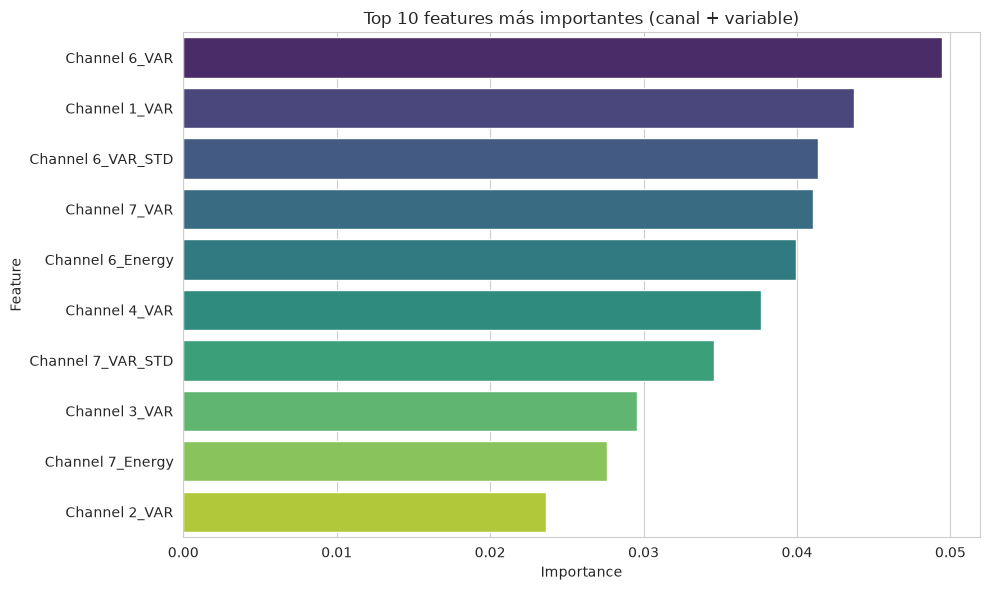

In [26]:
top_10 = importances.head(10)
plt.figure(figsize=(10, 6))
sns.barplot(data=top_10, y='Feature', x='Importance', palette='viridis')
plt.title('Top 10 features más importantes (canal + variable)')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

## Parte 7 — Clusters: PCA y t-SNE por tipo de agarre
Reducimos las 64 variables (8 canales x 8 features) a 2 dimensiones para ver si los agarres forman grupos separables.

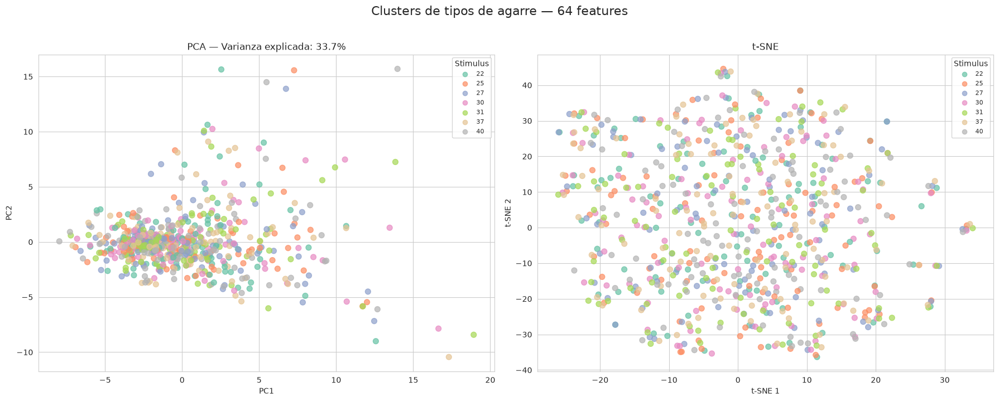

In [27]:
X = df_final[signal_cols].values
y = df_final['stimulus'].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

scatter1 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='Set2', s=50, alpha=0.7)
axes[0].set_title(f'PCA — Varianza explicada: {pca.explained_variance_ratio_.sum():.1%}')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].legend(*scatter1.legend_elements(), title='Stimulus', fontsize=8)

scatter2 = axes[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='Set2', s=50, alpha=0.7)
axes[1].set_title('t-SNE')
axes[1].set_xlabel('t-SNE 1')
axes[1].set_ylabel('t-SNE 2')
axes[1].legend(*scatter2.legend_elements(), title='Stimulus', fontsize=8)

fig.suptitle('Clusters de tipos de agarre — 64 features', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

## Parte 8 — Clusters por género
Mismo PCA de la Parte 7, separado en dos paneles (Male / Female) para ver si el patrón de agarres cambia según el género.

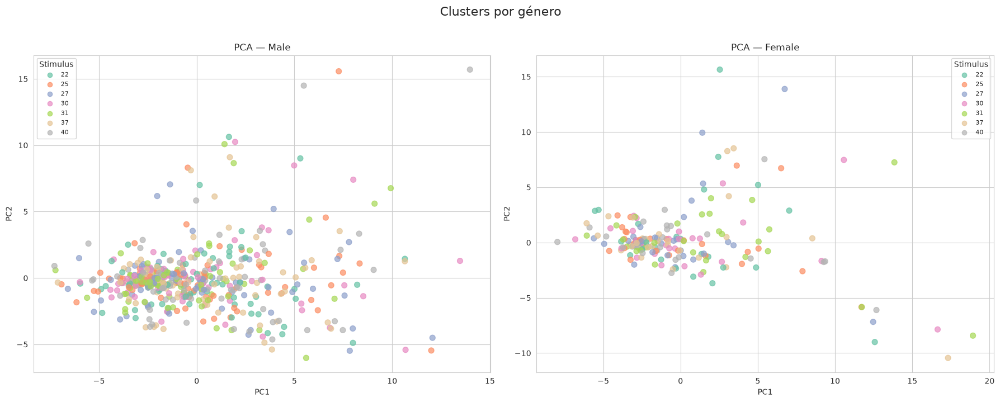

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
for i, gender in enumerate(['Male', 'Female']):
    mask = df_final['Gender'] == gender
    scatter = axes[i].scatter(X_pca[mask, 0], X_pca[mask, 1], c=y[mask], cmap='Set2', s=50, alpha=0.7)
    axes[i].set_title(f'PCA — {gender}')
    axes[i].set_xlabel('PC1')
    axes[i].set_ylabel('PC2')
    axes[i].legend(*scatter.legend_elements(), title='Stimulus', fontsize=8)

fig.suptitle('Clusters por género', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

## Parte 9 — Clusters por categoría de IMC
PCA y t-SNE coloreados por categoría de Índice de Masa Corporal, para ver si el IMC del sujeto influye en la forma de la señal.

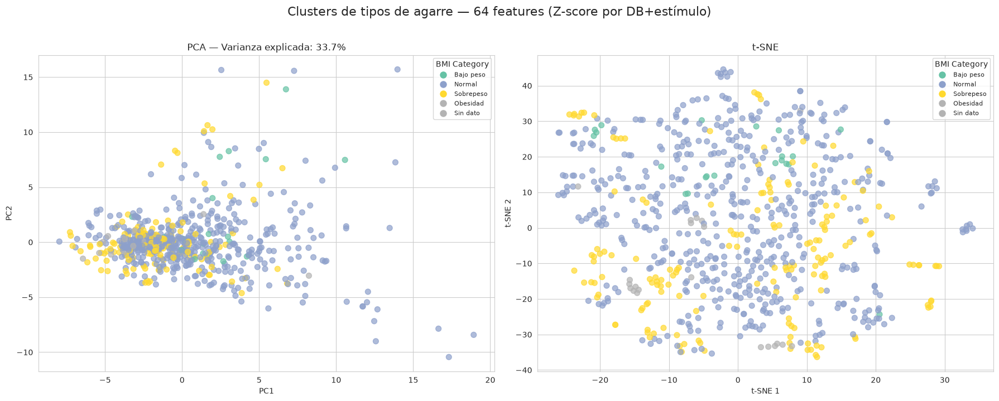

In [29]:
X = df_final[signal_cols].values
y_cat = pd.Categorical(df_final['BMI Category'])
y_codes = y_cat.codes  # -1 = sin categoría (NaN de IMC)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)

# Colores discretos: uno por categoría, más gris para 'sin dato' (código -1)
n_cat = len(y_cat.categories)
palette = plt.cm.Set2(np.linspace(0, 1, n_cat))
color_lookup = {code: palette[code] for code in range(n_cat)}
color_lookup[-1] = (0.7, 0.7, 0.7, 1.0)  # gris para NaN
point_colors = [color_lookup[code] for code in y_codes]

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

axes[0].scatter(X_pca[:, 0], X_pca[:, 1], c=point_colors, s=50, alpha=0.7)
axes[0].set_title(f'PCA — Varianza explicada: {pca.explained_variance_ratio_.sum():.1%}')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')

axes[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=point_colors, s=50, alpha=0.7)
axes[1].set_title('t-SNE')
axes[1].set_xlabel('t-SNE 1')
axes[1].set_ylabel('t-SNE 2')

# Leyenda común: usa exactamente los mismos colores que el scatter
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor=color_lookup[i],
           markersize=10, label=cat)
    for i, cat in enumerate(y_cat.categories)
]
if (y_codes == -1).any():
    legend_elements.append(
        Line2D([0], [0], marker='o', color='w', markerfacecolor=color_lookup[-1],
               markersize=10, label='Sin dato')
    )
axes[0].legend(handles=legend_elements, title='BMI Category', fontsize=8)
axes[1].legend(handles=legend_elements, title='BMI Category', fontsize=8)

fig.suptitle('Clusters de tipos de agarre — 64 features (Z-score por DB+estímulo)', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

## Parte 10 — Efecto de la base de datos de origen (Database)
Como el dataset combina varias bases NinaPro (DB1, DB2, DB4, DB5, DB7), revisamos si las diferencias observadas realmente vienen del tipo de agarre o si son un artefacto de la base de datos de origen.

Promedio de cada variable por Database y agarre (primeras 4 variables).

/tmp/ipykernel_4782/2238542825.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_final, x='Database', y=mean_col, ax=ax, palette='Set2')
/tmp/ipykernel_4782/2238542825.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_final, x='Database', y=mean_col, ax=ax, palette='Set2')
/tmp/ipykernel_4782/2238542825.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_final, x='Database', y=mean_col, ax=ax, palette='Set2')
/tmp/ipykernel_4782/2238542825.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is dep

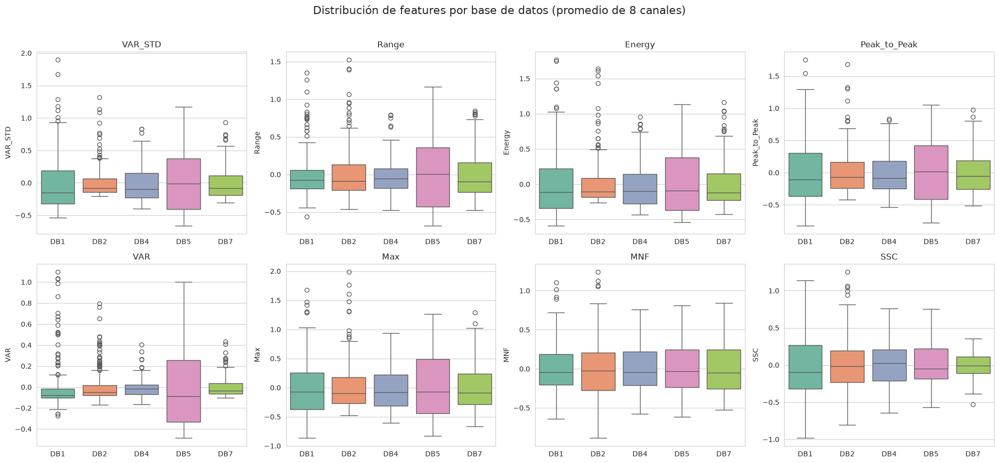

In [30]:
features = ['VAR_STD', 'Range', 'Energy', 'Peak_to_Peak', 'VAR', 'Max', 'MNF', 'SSC']

# Crear columna promedio por feature (promedio de los 8 canales)
for feat in features:
    feat_cols = [f'Channel {ch}_{feat}' for ch in range(1, 9)]
    df_final[f'{feat}_mean'] = df_final[feat_cols].mean(axis=1)

# Plot
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle('Distribución de features por base de datos (promedio de 8 canales)', fontsize=16, y=1.02)

for idx, feat in enumerate(features):
    ax = axes[idx // 4, idx % 4]
    mean_col = f'{feat}_mean'
    sns.boxplot(data=df_final, x='Database', y=mean_col, ax=ax, palette='Set2')
    ax.set_title(feat)
    ax.set_xlabel('')
    ax.set_ylabel(feat)

plt.tight_layout()
plt.show()

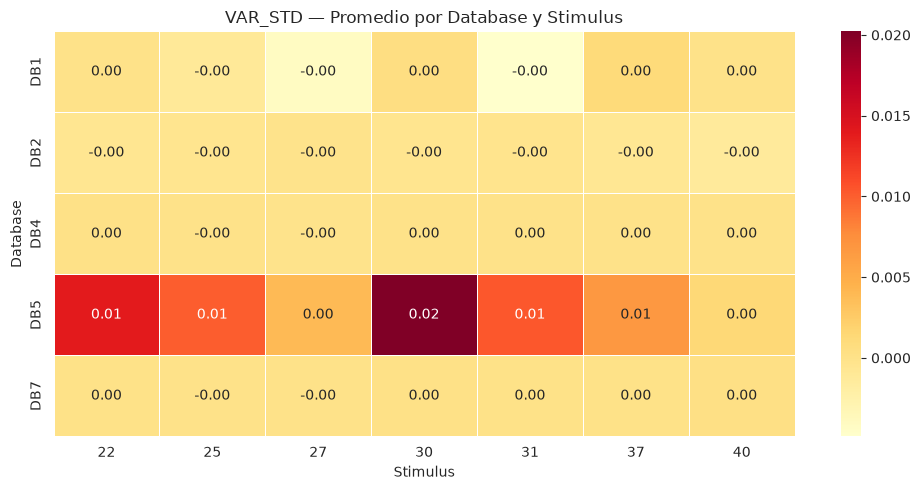

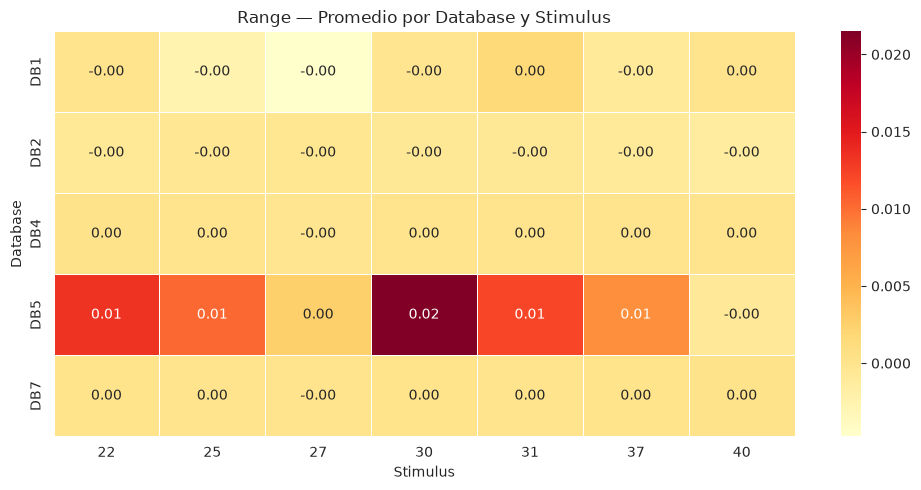

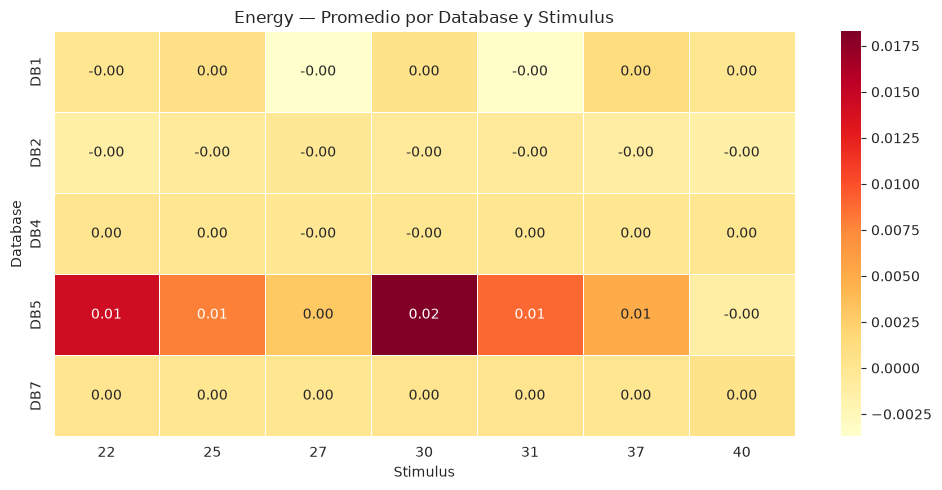

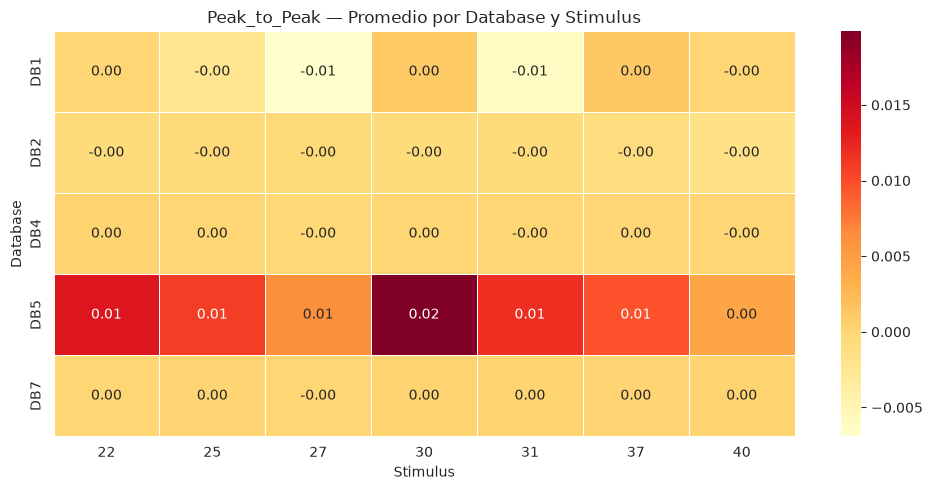

In [31]:
for feat in features[:4]:
    mean_col = f'{feat}_mean'
    pivot = df_final.groupby(['Database', 'stimulus'])[mean_col].mean().unstack()
    
    plt.figure(figsize=(10, 5))
    sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlOrRd', linewidths=0.5)
    plt.title(f'{feat} — Promedio por Database y Stimulus')
    plt.xlabel('Stimulus')
    plt.ylabel('Database')
    plt.tight_layout()
    plt.show()

Interacción Database x Stimulus para las 8 variables (canal 1).

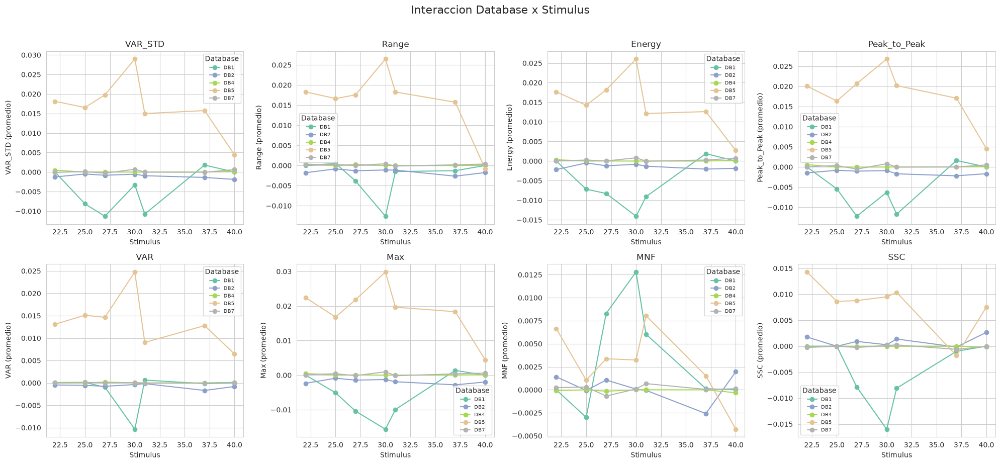

In [32]:
fig, axes = plt.subplots(2, 4, figsize=(20, 9))
fig.suptitle('Interaccion Database x Stimulus', fontsize=16, y=1.02)

for idx, feat in enumerate(features):
    ax = axes[idx // 4, idx % 4]
    col = f'Channel 1_{feat}'
    pivot = df_final.groupby(['Database', 'stimulus'])[col].mean().unstack()
    pivot.T.plot(kind='line', marker='o', ax=ax, colormap='Set2')
    ax.set_title(feat)
    ax.set_xlabel('Stimulus')
    ax.set_ylabel(f'{feat} (promedio)')
    ax.legend(title='Database', fontsize=7)

plt.tight_layout()
plt.show()

¿El PCA separa mejor por Database o por tipo de agarre?

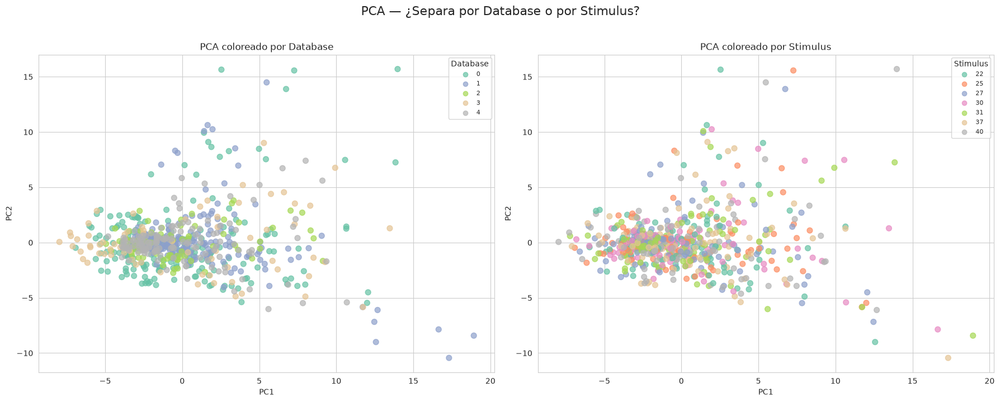

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

scatter1 = axes[0].scatter(X_pca[:, 0], X_pca[:, 1], 
                           c=df_final['Database'].astype('category').cat.codes, 
                           cmap='Set2', s=50, alpha=0.7)
axes[0].set_title('PCA coloreado por Database')
axes[0].set_xlabel('PC1')
axes[0].set_ylabel('PC2')
axes[0].legend(*scatter1.legend_elements(), title='Database', fontsize=8)

scatter2 = axes[1].scatter(X_pca[:, 0], X_pca[:, 1], 
                           c=y, cmap='Set2', s=50, alpha=0.7)
axes[1].set_title('PCA coloreado por Stimulus')
axes[1].set_xlabel('PC1')
axes[1].set_ylabel('PC2')
axes[1].legend(*scatter2.legend_elements(), title='Stimulus', fontsize=8)

fig.suptitle('PCA — ¿Separa por Database o por Stimulus?', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

Mismo chequeo, con t-SNE.

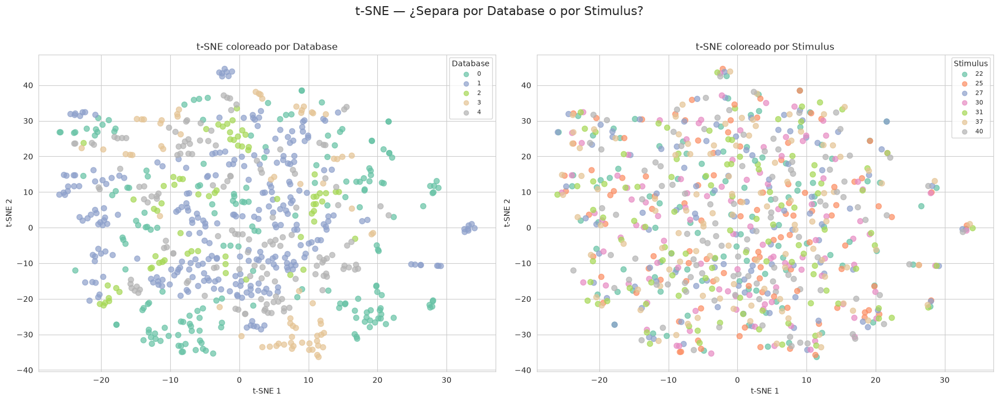

In [34]:
tsne_db = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne_db = tsne_db.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

scatter1 = axes[0].scatter(X_tsne_db[:, 0], X_tsne_db[:, 1], 
                           c=df_final['Database'].astype('category').cat.codes,
                           cmap='Set2', s=50, alpha=0.7)
axes[0].set_title('t-SNE coloreado por Database')
axes[0].set_xlabel('t-SNE 1')
axes[0].set_ylabel('t-SNE 2')
axes[0].legend(*scatter1.legend_elements(), title='Database', fontsize=8)

scatter2 = axes[1].scatter(X_tsne_db[:, 0], X_tsne_db[:, 1], 
                           c=y, cmap='Set2', s=50, alpha=0.7)
axes[1].set_title('t-SNE coloreado por Stimulus')
axes[1].set_xlabel('t-SNE 1')
axes[1].set_ylabel('t-SNE 2')
axes[1].legend(*scatter2.legend_elements(), title='Stimulus', fontsize=8)

fig.suptitle('t-SNE — ¿Separa por Database o por Stimulus?', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()